In [7]:
import requests
from tqdm import tqdm 
from thefuzz import fuzz
from bs4 import BeautifulSoup
import bibtexparser
from bibtexparser.bwriter import BibTexWriter
from bibtexparser.bibdatabase import BibDatabase


input_path = '../custom.bib'
output_path = '../custom_new.bib'

with open(input_path) as bibtex_file:
    bib_database = bibtexparser.load(bibtex_file)

new_entries = []
for entry in tqdm(bib_database.entries, total=len(bib_database.entries)):
    title = entry['title'].replace("{","").replace("}","")
    if 'bibsource' in entry and 'dblp' in entry['bibsource']:
        new_entries.append(entry)
        continue
    # search 
    base_url = 'https://dblp.org/search'
    output = requests.get(base_url, params={"q":title})
    soup = BeautifulSoup(output.text, 'html.parser')
    res = soup.find_all('ul',{'class':'publ-list'})[0]
    all_item = res.find_all('li',{"itemtype":"http://schema.org/ScholarlyArticle"})

    bibtex_url = None
    for item in all_item:
        new_title = item.find_all('span',{"class":"title"})[0].text
        new_url = item.find_all('a',{"rel":"nofollow"})[0]['href']
        if fuzz.ratio(new_title.lower(), title.lower()) >= 90:
            bibtex_url = new_url
            break
    if bibtex_url is None or 'bibtex' not in bibtex_url:
        print(f'`{title}` not find!')
        new_entries.append(entry)
        continue

    # get bibtext
    output = requests.get(bibtex_url)
    soup = BeautifulSoup(output.text,'html.parser')
    tex_str = soup.find_all('pre',{'class':'verbatim select-on-click'})[0].text
    new_entry = bibtexparser.loads(tex_str).entries[0]
    # check entry
    new_title = new_entry['title']
    new_entry['ID'] = entry['ID']
    new_entries.append(new_entry)


db = BibDatabase()
db.entries = new_entries
writer = BibTexWriter()
with open(output_path, 'w') as bibfile:
    bibfile.write(writer.write(db))

 22%|██▏       | 19/88 [00:33<01:47,  1.56s/it]

`A Survey of Large Language Models` not find!


 70%|███████   | 62/88 [01:58<00:48,  1.86s/it]

`Evaluation Metrics for Language Modeling` not find!


 78%|███████▊  | 69/88 [02:09<00:26,  1.38s/it]

`ROUGE: A Package for Automatic Evaluation of Summaries` not find!


100%|██████████| 88/88 [02:40<00:00,  1.83s/it]


In [8]:
from transformers import Qwen2Tokenizer, Qwen2ForCausalLM, Qwen2Config

0.2

In [34]:
from langchain_huggingface import HuggingFaceEndpointEmbeddings
from typing import List
from langchain_core.documents import Document
from langchain_community.vectorstores import FAISS
from langchain_openai import OpenAIEmbeddings
from langchain_text_splitters import CharacterTextSplitter

# documents = Document(
# text_splitter = CharacterTextSplitter(chunk_size=1000, chunk_overlap=0)
# texts = text_splitter.split_documents(documents)
# embeddings = OpenAIEmbeddings()
# db = FAISS.from_documents(texts, embeddings)
class TEIEmbeddings(HuggingFaceEndpointEmbeddings):
    def embed_documents(self, texts: List[str]) -> List[List[float]]:
        # replace newlines, which can negatively affect performance.
        texts = [text.replace("\n", " ") for text in texts]
        #  truncate to 1024 tokens approximately
        for i in range(len(texts)):
            text = texts[i]
            words = text.split(" ")
            if len(words) > 1024:
                text = " ".join(words[:1024])
                texts[i] = text

        _model_kwargs = self.model_kwargs or {}
        try:
            #  api doc: https://huggingface.github.io/text-embeddings-inference/#/Text%20Embeddings%20Inference/embed
            responses = self.client.post(
                json={"inputs": texts, **_model_kwargs}, task=self.task
            )
        except Exception as e:
            print(f"error: {e}")
            json.dump(texts, open("error_texts.json", "w"))
        return json.loads(responses.decode())
    
embedder = TEIEmbeddings(
            model="http://bge-large-en-tanjiejun.gw-gqqd25no78ncp72xfw-1151584402193309.cn-wulanchabu.pai-eas.aliyuncs.com/",
            model_kwargs={"truncate": True})

/cpfs01/user/bc_search_intern/jiejuntan/anaconda3/envs/vllm/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
def get_embed(text):
    inputs = tokenizer(text, return_tensors="pt")
    outputs = model(**inputs)
    return outputs.last_hidden_state[0][0].detach().numpy()

In [ ]:
import asyncio
#  annotate tag relevance
from tqdm import tqdm
import json
import bs4
import concurrent.futures

split = "test"
rewrite_method = "slimplmqr"
dataset = "asqa"
input_file=f"../html_data/{dataset}/bing/binghtml-{rewrite_method}-{dataset}-simple-{split}.jsonl"
data_lines=[json.loads(line) for line in open(input_file)]
data_lines = data_lines[7:]
with concurrent.futures.ThreadPoolExecutor(max_workers=32) as executor:
    for data in tqdm(data_lines):
        htmls=[h["html"] for h in data[f'{rewrite_method}_results']]
        question=data["question"]
        question_embed = embedder.embed_query(question)
        all_html_nodes = []
        for h_index, html in enumerate(htmls):
            soup = bs4.BeautifulSoup(html, 'html.parser')
            all_tag_names = []
            # all_tag_texts = []
            all_tag_children = []
            all_tag_embeds = []
            all_nodes = []
            for idx, tag in enumerate(soup.find_all()):
                tag["index"] = idx
                all_tag_names.append(tag.name)
                # all_tag_texts.append(tag.get_text())
                tag_children=[]
                for c in tag.contents:
                    if isinstance(c, bs4.element.Tag):
                        tag_children.append(-1)
                    else:
                        if str(c).strip() != "":
                            tag_children.append(str(c).strip())
                all_tag_children.append(tag_children)
                #  if not root node
                if not isinstance(tag.parent, bs4.BeautifulSoup):
                    # assert "index" in tag.parent, f"tag: {tag.name}, parent: {tag.parent.name}"
                    p_children=all_tag_children[tag.parent["index"]]
                    p_children[p_children.index(-1)] = idx
                direct_text = " ".join([t for t in tag_children if isinstance(t, str)])
                all_nodes.append(Document(page_content=direct_text, metadata={"tag":tag.name, "h_index": h_index, "t_index":idx, "children":tag_children}))
            non_empty_nodes=[d for d in all_nodes if d.page_content.strip() != ""]
            all_html_nodes.append(all_nodes)
            if len(non_empty_nodes) == 0:
                continue
            batch_size = 1024
            future = executor.submit(FAISS.from_documents, non_empty_nodes[:batch_size], embedder)
            db = future.result()
            for doc_batch_idx in range(batch_size, len(non_empty_nodes), batch_size):
                future = executor.submit(db.add_documents, non_empty_nodes[doc_batch_idx:doc_batch_idx+batch_size])
                future.result()
            res=db.similarity_search_with_score_by_vector(embedding=question_embed, k=len(non_empty_nodes))
            #  add relevance score to metadata
            for r in res:
                r[0].metadata["relevance"] = r[1]
            #  sort by h_index and t_index
            # res = sorted(res, key=lambda x: (x[0].metadata["h_index"], x[0].metadata["t_index"]))
        #  calculate empty node relevance score
        for h_index in range(len(htmls)):
            def calculate_relevance(node):
                tag_children = [c for c in node.metadata["children"] if isinstance(c, int)]
                for c in tag_children:
                    calculate_relevance(all_html_nodes[h_index][c])
                if len(tag_children) > 0:
                    children_relevance = [all_html_nodes[h_index][c].metadata["relevance"] for c in tag_children]
                    if "relevance" in node.metadata:
                        children_relevance.append(node.metadata["relevance"])
                    node.metadata["relevance"] = sum(children_relevance) / len(children_relevance)
                else:
                    if "relevance" not in node.metadata:
                        node.metadata["relevance"] = 0.0
            for t_index in range(len(all_html_nodes[h_index])):
                calculate_relevance(all_html_nodes[h_index][t_index])
                

In [198]:
#  test gpt4 prompting
import os
import json
import requests
from requests.adapters import HTTPAdapter
from requests.packages.urllib3.util.retry import Retry
#openai_api = os.environ.get('OPENAI_API_ADDR') if os.environ.get('OPENAI_API_ADDR') else "https://api.openai.com"
openai_api = "http://47.236.144.103"
class OpenAIApiException(Exception):
    def __init__(self, msg, error_code):
        self.msg = msg
        self.error_code = error_code
class OpenAIApiProxy():
    def __init__(self, api_key=None):
        retry_strategy = Retry(
            total=1,  # 最大重试次数（包括首次请求）
            backoff_factor=1,  # 重试之间的等待时间因子
            status_forcelist=[429, 500, 502, 503, 504],  # 需要重试的状态码列表
            allowed_methods=["POST"]  # 只对POST请求进行重试
        )
        adapter = HTTPAdapter(max_retries=retry_strategy)
        # 创建会话并添加重试逻辑
        self.session = requests.Session()
        self.session.mount("https://", adapter)
        self.session.mount("http://", adapter)
        self.api_key = api_key
    def call(self, model_name, prompt, headers={}):
        params_gpt = {"model": model_name, "messages": [{"role": "user", "content": ''}], "max_tokens": 1024,
                      "temperature": 0.01, "top_p": 1}
        params_gpt['messages'][0]['content'] = prompt
        headers['Content-Type'] = headers['Content-Type'] if 'Content-Type' in headers else 'application/json'
        if self.api_key:
            headers['Authorization'] = "Bearer " + self.api_key
        url = openai_api + '/v1/chat/completions'
        # url = openai_api + '/v1/completions'
        # print(url)
        # print(json.dumps(params_gpt, indent=4, ensure_ascii=False))
        response = self.session.post(url, headers=headers, data=json.dumps(params_gpt))
        # print(response.text)
        if response.status_code != 200:
            err_msg = "access openai error, status code: %s，errmsg: %s" % (response.status_code, response.text)
            raise OpenAIApiException(err_msg, response.status_code)
        
        data = json.loads(response.text)
        return data

In [205]:
proxy = OpenAIApiProxy("sk-Sqzhs93Jhj74OtMqF81cAc07607c47C4B133A10e68Dc2201")
    
prefix_prompt = """
Your task is to perform text analysis on an HTML document and a piece of fact. You need to follow the following rules:

1. Identify the most relevant text piece in the HTML document. 
2. This text piece could either be a direct paraphrase to the fact, or a supporting evidence that can be used to infer the fact.
3. This text piece could be contained in a single HTML tag, or span multiple continuous tags. The text piece should be directly copied from the HTML document. If the text piece involves multiple tags, you should keep the original format of the text piece.
4. The overall length of the text piece should be more than 300 words and less than 500 words.
6. The general format of the output should be: <tag>content</tag> or <tag>content1</tag><tag>content2</tag>...
7. If no relevant text piece is found, you simply need to return "No relevant text piece found.".
"""
model = 'gpt-4o'
# model='gpt-3.5-turbo-instruct'

In [1]:
#  sample training data
import json
dataset = "musique"
search_engine = "bing"
split = "test"
rewrite_method = "slimplmqr"
node_file=f"../html_data/{dataset}/{search_engine}/{search_engine}html-{rewrite_method}-{dataset}-simple-{split}.jsonl"
node_lines=[json.loads(line) for line in open(node_file)]
if "answers" in node_lines[0]:
    answers = [node_line['answers'] for node_line in node_lines]
elif "short_answers" in node_lines[0]:
    answers = [node_line['short_answers'] for node_line in node_lines]
elif "answer" in node_lines[0]:
    answers = [node_line['answer'] for node_line in node_lines]
else:
    raise NotImplementedError("answers not found in node_lines")


In [9]:

import string
import re


def normalize_answer(s):
  """Lower text and remove punctuation, articles and extra whitespace."""

  def remove_articles(text):
    return re.sub(r'\b(a|an|the)\b', ' ', text)

  def white_space_fix(text):
    return ' '.join(text.split())

  def remove_punc(text):
    exclude = set(string.punctuation)
    return ''.join(ch for ch in text if ch not in exclude)

  def lower(text):
    return text.lower()

  return white_space_fix(remove_articles(remove_punc(lower(s))))

def calculate_short_answer_EM(generated_answer, gold_answers, language="en"):
    if isinstance(gold_answers, str):
        gold_answers = [gold_answers]
    if language == "en":
        generated_answer=normalize_answer(generated_answer)
    else:
        pass
    match=0
    for gold_answer in gold_answers:
        gold_answer=normalize_answer(gold_answer)
        if gold_answer in generated_answer:
            match+=1
    return {
        "exact_match": match/len(gold_answers),
        "hit1": match>0
    }

# sample training data
import evaluate
from collections import defaultdict
#  parse gpt4 response
import bs4
rouge=evaluate.load("../evaluate_utils/rouge/")


In [4]:
from tqdm import tqdm
    
def get_best_tree(htmls, answer):
    all_trees = []
    best_trees = []
    find_exact_match = False
    for h_index, html in enumerate(htmls):
        soup = bs4.BeautifulSoup(html, 'html.parser')
        word_count = len(soup.get_text().split())
        if word_count > 500:
            possible_trees = [(soup, [])]
            target_trees = []
            #  split the entire dom tee into subtrees, until the length of the subtree is less than 500 words
            #  find all possible trees
            while True:
                if len(possible_trees) == 0:
                    break
                tree = possible_trees.pop(0)
                tag_children = defaultdict(int)
                bare_word_count = 0
                #  count child tags
                for child in tree[0].contents:
                    if isinstance(child, bs4.element.Tag):
                        tag_children[child.name] += 1
                _tag_children = {k: 0 for k in tag_children.keys()}
                for child in tree[0].contents:
                    if isinstance(child, bs4.element.Tag):
                        #  change child tag with duplicate names
                        if tag_children[child.name] > 1:
                            new_name = f"{child.name}{_tag_children[child.name]}"
                            new_tree = (child, tree[1] + [new_name])
                            _tag_children[child.name] += 1
                            child.name = new_name
                        else:
                            new_tree = (child, tree[1] + [child.name])
                        word_count = len(child.get_text().split())
                        if word_count > 500:
                            possible_trees.append(new_tree)
                        else:
                            target_trees.append(new_tree)
                    else:
                        bare_word_count += len(str(child).split())

                #  add node with more than 500 words
                if bare_word_count > 500:
                    target_trees.append(tree)
                #  add leaf node
                if len(tag_children) == 0:
                    target_trees.append(tree)

            #  find the best subtree
            best_tree = None
            best_score = 0
            # resp_text = resp_soup
            for tree in target_trees:
                #  calculate the rouge1 score of raw text
                tree_text = str(tree[0])
                matching_score = calculate_short_answer_EM(tree_text, answer)["exact_match"]
                if matching_score > best_score:
                    best_score = matching_score
                    best_tree = tree
                    find_exact_match = True
        else:
            # word count < 500
            # count soup child
            soup_children = [c for c in soup.contents if isinstance(c, bs4.element.Tag)]

            if len(soup_children) == 1:
                best_tree = (soup_children[0], [soup_children[0].name])
                target_trees = [best_tree]
            else:
                # add an html tag to wrap all children
                new_soup = bs4.BeautifulSoup("", 'html.parser')
                new_tag = new_soup.new_tag("html")
                new_soup.append(new_tag)
                for child in soup_children:
                    new_tag.append(child)
                best_tree = (new_tag, ["html"])
                target_trees = [best_tree]
            best_score = calculate_short_answer_EM(str(best_tree[0]), answer)["exact_match"]
            if best_score > 0:
                find_exact_match = True

        all_trees.append(target_trees)
        if find_exact_match:
            best_trees.append(({
                "h_index": h_index,
                "best_tree": best_tree,
                "best_score": best_score,
            }))

    if not find_exact_match:
        #  if no exact match, drop this sample
        best_trees = []
    return best_trees, find_exact_match

import random
def get_html_ref(htmls, best_tree, tokenizer):
    html_context_lens = [len(tokenizer.encode(html)) for html in htmls]
    total_context_len = sum(html_context_lens)
    while total_context_len > 192000 - 2048:
        #  remove the html with the largest length, except the first one
        if len(htmls) == 1:
            #  drop sample if only one html and still too long
            return ""
        max_len_idx = html_context_lens.index(max(html_context_lens[1:]))
        htmls.pop(max_len_idx)
        html_context_lens.pop(max_len_idx)
        total_context_len = sum(html_context_lens)

    #  shuffle the input refs
    #  the best html is originally the first one
    shuffle_idx = random.sample(range(len(htmls)), len(htmls))
    htmls = [htmls[i] for i in shuffle_idx]
    best_html_idx = shuffle_idx.index(0)
    soups = [bs4.BeautifulSoup(html, 'html.parser') for html in htmls]
    #  change name for duplicate tags in soup content
    tag_children = defaultdict(int)
    for soup in soups:
        for child in soup.contents:
            if isinstance(child, bs4.element.Tag):
                tag_children[child.name] += 1
    _tag_children = {k: 0 for k in tag_children.keys()}
    for idx, soup in enumerate(soups):
        for child in soup.contents:
            if isinstance(child, bs4.element.Tag):
                #  change child tag with duplicate names
                if tag_children[child.name] > 1:
                    new_name = f"{child.name}{_tag_children[child.name]}"
                    if idx == best_html_idx and child.name == best_tree['best_tree'][1][0]:
                        # print(f"idx {idx} change tag name {child.name} to {new_name}")
                        best_tree['best_tree'][1][0] = new_name
                        if len(best_tree['best_tree'][1]) == 1:
                            best_tree['best_tree'][0].name = new_name
                    _tag_children[child.name] += 1
                    child.name = new_name
    #  add all htmls to a single soup
    all_soup = bs4.BeautifulSoup("", 'html.parser')
    for soup in soups:
        all_soup.append(soup)
    return str(all_soup)
        

In [20]:
import random
#  analyze the best tree distribution
from tqdm import tqdm
samples = []
no_exact_match = 0
dataset_start_id={"asqa": 1000, "hotpot-qa": 2000, "nq": 3000, "trivia-qa": 4000, "musique": 5000}
input_prompt="**HTML**: ```{input_html}```\n**Question**: **{question}**\n Your task is to identify the most relevant text piece to the given question in the HTML document. This text piece could either be a direct paraphrase to the fact, or a supporting evidence that can be used to infer the fact. The overall length of the text piece should be more than 300 words and less than 500 words. You should provide the path to the text piece in the HTML document. An example for the output is: <html 1><body><div 2><p>Some key information ..."
for idx in tqdm(range(10), desc=f"Making samples for {dataset} {split}"):
    question = node_lines[idx]["question"]
    htmls = [h["html"] for h in node_lines[idx][f'{rewrite_method}_results']]
    answer = answers[idx]
    # fact=" ".join(node_lines[idx]["long_answers"])
    # prompt = f"*HTML*: ```{html}```\n*Fact*: ```{fact}```\n{prefix_prompt}"
    # openai_response = proxy.call(model, prompt)
    # print(openai_response['choices'][idx]['message']['content'])

    # resp=openai_response['choices'][0]['message']['content']
    # resp_soup = bs4.BeautifulSoup(resp, 'html.parser')
    best_trees, find_exact_match = get_best_tree(htmls, answer)
    # print(f"matched number: {len([t for t in best_trees if t['best_score'] > 1])}")
    # print(f"max score: {max([t['best_score'] for t in best_trees])}")
    if find_exact_match:
        unmatched_trees = [t for t in best_trees if t['best_score'] == 0]
        sorted_trees = sorted(best_trees, key=lambda x: x['best_score'], reverse=True)
        best_html_tree = sorted_trees[0]
    else:
        # sorted_trees = sorted(best_trees, key=lambda x: x['best_score'], reverse=True)
        # best_html_tree = sorted_trees[0]
        # unmatched_trees = best_trees[len(best_trees) // 2:]
        no_exact_match += 1
        continue
    #  take the best tree and sample several unmatched trees
    input_ref_idxs = [best_html_tree['h_index']] + [t['h_index'] for t in unmatched_trees]

    input_refs = [htmls[i] for i in input_ref_idxs]
    input_html = get_html_ref(input_refs, best_html_tree, tokenizer)
    input_msg=input_prompt.format(input_html=input_html, question=question)
    if len(best_html_tree['best_tree'][1]) > 0:
        assert best_html_tree['best_tree'][0].name == best_html_tree["best_tree"][1][-1], f"Tag mismatch {best_html_tree['best_tree'][0].name} != {best_html_tree['best_tree'][1][-1]}"
        output_msg = "<"+"><".join(best_html_tree['best_tree'][1][:-1]) + ">"+ str(best_html_tree['best_tree'][0])
    else:
        output_msg = str(best_html_tree['best_tree'][0])
    
    sample = {
                "id": f"{dataset_start_id[dataset]+idx}",
                "messages": [{"role": "user", "content": input_msg}, {"role": "assistant", "content": output_msg}],
                "score": best_html_tree['best_score'],
            }
    
    samples.append(sample)
    
# version = "v0701"
# output_path = f"../html_data/pathgen/{version}.jsonl"
# with open(output_path, 'w') as f:
#     for sample in samples:
#         f.write(json.dumps(sample) + "\n")

Making samples for asqa trainfew:  10%|█         | 1/10 [00:01<00:09,  1.10s/it]

idx 2 change tag name html to html 2


Making samples for asqa trainfew:  20%|██        | 2/10 [00:01<00:05,  1.42it/s]

idx 1 change tag name html to html 1
idx 0 change tag name html to html 0


Making samples for asqa trainfew:  40%|████      | 4/10 [00:01<00:02,  2.74it/s]

idx 1 change tag name html to html 1


Making samples for asqa trainfew:  50%|█████     | 5/10 [00:02<00:02,  2.06it/s]

idx 0 change tag name html to html 0
idx 8 change tag name html to html 8


Making samples for asqa trainfew:  70%|███████   | 7/10 [00:03<00:01,  1.97it/s]

idx 2 change tag name html to html 2


Making samples for asqa trainfew:  80%|████████  | 8/10 [00:03<00:00,  2.34it/s]

idx 5 change tag name html to html 5


Making samples for asqa trainfew:  90%|█████████ | 9/10 [00:04<00:00,  1.65it/s]

idx 4 change tag name html to html 1


Making samples for asqa trainfew: 100%|██████████| 10/10 [00:05<00:00,  1.68it/s]

idx 25 change tag name html to html 20


In [119]:
best_html_tree

{'h_index': 15,
 'best_tree': (<!DOCTYPE html>
  
  <html><title>A Million Ways to Die in the West (2014) - Filming &amp; production - IMDb</title><div><div><span>Menu</span><div><span><span>Movies</span><ul><span>Release Calendar</span><span>Top 250 Movies</span><span>Most Popular Movies</span><span>Browse Movies by Genre</span><span>Top Box Office</span><span>Showtimes &amp; Tickets</span><span>Movie News</span><span>India Movie Spotlight</span></ul></span><div><span><span>TV Shows</span><ul><span>What's on TV &amp; Streaming</span><span>Top 250 TV Shows</span><span>Most Popular TV Shows</span><span>Browse TV Shows by Genre</span><span>TV News</span></ul></span><span><span>Watch</span><ul><span>What to Watch</span><span>Latest Trailers</span><span>IMDb Originals</span><span>IMDb Picks</span><span>IMDb Spotlight</span><span>IMDb Podcasts</span></ul></span></div><span><span>Awards &amp; Events</span><ul><span>Oscars</span><span>ABFF</span><span>Pride</span><span>STARmeter Awards</span>

In [116]:
train_file="../html_data/treegen/v0701/asqa.jsonl"
train_lines=[json.loads(line) for line in open(train_file)]

idx=0
print(train_lines[idx].keys())
print(f"id: {train_lines[idx]['id']}")
print(f"messages: {train_lines[idx]['messages']}")
print(f"score: {train_lines[idx]['score']}")

dict_keys(['id', 'messages', 'score'])
id: 1000
messages: [{'role': 'user', 'content': '**HTML**: ```<!DOCTYPE html>\n\n<html 0>\n<title>Tennessee wins the 2024 Men\'s College World Series | NCAA.com</title>\n<body>\n<a>\n      Skip to main content\n    </a>\n<div>\n<header>\n<a><span>View </span>All Scores</a>\n<div>\n<div><span>NCAA.com</span><div><ul><a>Live Video</a><li><span>Sports</span><div><h3>\n        Sports\n        </h3><div><h4>\n            Fall\n            </h4><ul><a>Cross Country - Men</a><a>Cross Country - Women</a><li><span>Cross Country</span><div><a><span>M</span><span>Men</span></a><a><span>W</span><span>Women</span></a></div></li><a>Field Hockey</a><a>Football</a><a>Soccer - Men</a><a>Soccer - Women</a><li><span>Soccer</span><div><a><span>M</span><span>Men</span></a><a><span>W</span><span>Women</span></a></div></li><a>Volleyball - Women</a><a>Water Polo - Men</a></ul></div><div><h4>\n            Winter\n            </h4><ul><a>Basketball - Men</a><a>Basketball -

In [60]:
train_lines[idx]["tree"].get_text()

AttributeError: 'str' object has no attribute 'get_text'

In [53]:
html_doc = """<html>
<head>
<title>The Dormouse's story</title>
</head>
<body>
<p class="title"><b>The Dormouse's story</b></p>
<p class="story">Once upon a time there were three little sisters; and their names were
<a href="http://example.com/elsie" class="sister" id="link1">Elsie</a>,
<a href="http://example.com/lacie" class="sister" id="link2">Lacie</a> and
<a href="http://example.com/tillie" class="sister" id="link3">Tillie</a>;
and they lived at the bottom of a well.</p>
<p class="story">...</p>
</body>
</html>"""
soup = bs4.BeautifulSoup(html_doc, 'html.parser')


In [55]:
soup.contents

[<html>
 <head>
 <title>The Dormouse's story</title>
 </head>
 <body>
 <p class="title"><b>The Dormouse's story</b></p>
 <p class="story">Once upon a time there were three little sisters; and their names were
 <a class="sister" href="http://example.com/elsie" id="link1">Elsie</a>,
 <a class="sister" href="http://example.com/lacie" id="link2">Lacie</a> and
 <a class="sister" href="http://example.com/tillie" id="link3">Tillie</a>;
 and they lived at the bottom of a well.</p>
 <p class="story">...</p>
 </body>
 </html>]

In [246]:
question

'When was the first apple i phone made?'

In [4]:
import torch
from transformers import AutoTokenizer, AutoModelForCausalLM, AutoModelForSeq2SeqLM
import os

ckpt_path="../../../huggingface/glm-4-9b-chat-1m"
# ckpt_path="/cpfs01/shared/public/guopeidong/models/glm4-9b/glm4-9b-128k-v0701-node2/checkpoint-1554"
tokenizer = AutoTokenizer.from_pretrained(ckpt_path,trust_remote_code=True)
# model=AutoModelForCausalLM.from_pretrained("../../../huggingface/glm-4-9b-chat-1m",trust_remote_code=True)
model = AutoModelForSeq2SeqLM.from_pretrained(ckpt_path,trust_remote_code=True, torch_dtype=torch.float16)

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


[2024-07-30 19:55:15,673] [INFO] [real_accelerator.py:203:get_accelerator] Setting ds_accelerator to cuda (auto detect)
 [WARNING]  Please specify the CUTLASS repo directory as environment variable $CUTLASS_PATH
 [WARNING]  sparse_attn requires a torch version >= 1.5 and < 2.0 but detected 2.3
 [WARNING]  using untested triton version (2.3.1), only 1.0.0 is known to be compatible


2024-07-30 19:55:20.214 | INFO     | transformers_modules.glm-4-9b-chat-1m.modeling_chatglm:<module>:48 - Successfully imported Flash Attention 2.0
2024-07-30 19:55:20.231 | INFO     | transformers_modules.glm-4-9b-chat-1m.modeling_chatglm:__init__:990 - Using core attention implementation: flash_attention_2
2024-07-30 19:55:20.411 | INFO     | transformers_modules.glm-4-9b-chat-1m.modeling_chatglm:__init__:990 - Using core attention implementation: flash_attention_2
Loading checkpoint shards: 100%|██████████| 10/10 [00:44<00:00,  4.50s/it]


In [5]:
idx=381
node_line=node_lines[idx]
htmls = [h["html"] for h in node_line[f'{rewrite_method}_results']]
question = node_line["question"]

In [27]:
import requests

url="http://gw-gqqd25no78ncp72xfw-1151584402193309.cn-wulanchabu.pai-eas.aliyuncs.com/api/predict/chatglm9b1m_tanjiejun0"
api=f"{url}/html_tree_trim"

payload = {
    "question": [question],
    "htmls": [htmls],
    "model": "glm-4-9b-chat-1m",
}
response = requests.post(api, json=payload)
response.json()

JSONDecodeError: Expecting value: line 1 column 1 (char 0)

In [9]:
tokenizer.tokenize("<html><div>", add_special_tokens=False)

Keyword arguments {'add_special_tokens': False} not recognized.


[b'<html', b'><', b'div', b'>']

In [15]:
query = "你好,"

inputs = tokenizer.apply_chat_template([{"role": "user", "content": query *50000}],
                                       add_generation_prompt=True,
                                       tokenize=True,
                                       return_tensors="pt",
                                       return_dict=True,)
#  convert back to string
print(len(inputs["input_ids"][0]))

100005


In [121]:
import torch
force_token_id = torch.tensor([0,3,4])
logits = torch.randn(1, 1, 5)
probs = torch.gather(logits[:, 0, :], -1, force_token_id.unsqueeze(0))
print(logits)
print(probs)

tensor([[[-0.2603, -0.7151, -0.4088,  1.0213, -0.1192]]])
tensor([[-0.2603,  1.0213, -0.1192]])


In [32]:
node_line.keys()

dict_keys(['qa_pairs', 'wikipages', 'annotations', 'id', 'question', 'answer', 'short_answers', 'long_answers', 'slimplmqr_rewrite', 'slimplmqr_results'])

In [91]:
model.config._attn_implementation

'sdpa'

In [92]:
{
    "[gMASK]": 151331,
    "[sMASK]": 151332,
    "<sop>": 151333,
}


{'[gMASK]': 151331, '[sMASK]': 151332, '<sop>': 151333}

In [ ]:
sep_pattern = re.compile('|'.join(["[gMASK]", "[sMASK]", "<sop>"]))
text="""**HTML**: ```<!DOCTYPE html PUBLIC "-//W3C//DTD XHTML 1.0 Transitional//EN" "http://www.w3.org/TR/xhtml1/"""
for match in sep_pattern.finditer(text):
    sep_text = text[match.start():match.end()]
    print(match.group(), match.start(), match.end())
    # assert sep_text in ["[gMASK]", "[sMASK]", "<sop>"]

In [ ]:
file="../html_data/musique/bing/binghtml-slimplmqr-musique-trainfew.jsonl"
first_line=json.loads(open(file).readline())

In [2]:
first_line["slimplmqr_results"][0]["html"]

NameError: name 'first_line' is not defined

In [163]:
len(first_line["slimplmqr_results"])

16

In [ ]:
from vllm import LLM
from vllm.worker import worker
from vllm.model_executor import model_loader

In [5]:
from fastapi import FastAPI

app = FastAPI()


@app.get("/")
async def root():
    return {"message": "Hello World"}

In [34]:
import json
prob_file="../html_data/hotpot-qa/treegen/v0712/binghtml-slimplmqr-v0712-hotpot-qa-test.jsonl"
prob_lines=[json.loads(line) for line in open(prob_file)]

In [35]:
len(prob_lines)

400

In [39]:
import numpy as np
import bs4

for line in prob_lines:
    html = line["html"]
    paths = line["paths"]
    assert len(paths) > 0 and len(html) > 0 and len(paths[0]) > 0 and len(line["path_probs"]) == len(paths)
    #  convert string to np array
    path_probs = np.array([np.float32(p) for p in line["path_probs"]])
    
    paths = [{"path": paths[i], "prob": path_probs[i]} for i in range(len(paths))]
    #  sort paths by prob
    paths = sorted(paths, key=lambda x: x["prob"], reverse=True)
    
    soup = bs4.BeautifulSoup(html, 'html.parser')
    for idj in range(len(paths)):
        path = paths[idj]["path"]
        tag = soup
        for p in path:
            for child in tag.contents:
                if isinstance(child, bs4.element.Tag):
                    if child.name == p:
                        tag = child
                        break

In [31]:
soup=bs4.BeautifulSoup("", 'html.parser')
soup.append(bs4.BeautifulSoup("<html><body><div><p>hello</p></div></body></html>", 'html.parser'))
soup.html.name="html 1"
str(soup)

'<html 1><body><div><p>hello</p></div></body></html 1>'

In [13]:
# curl --location 'http://10.32.13.74:9080/ops/apis/v1alpha1/projects/PTnTCKsEEX1MJlAdwx0Ll9RJCfdQmEl8/models'
#  browse model
import requests
url='http://10.32.13.74:9080/ops/apis/v1alpha1/projects/PTnTCKsEEX1MJlAdwx0Ll9RJCfdQmEl8/models'
response = requests.get(url)
resp=response.json()
print([m for m in resp["items"] if "jiejun" in m["name"]])

ConnectionError: HTTPConnectionPool(host='10.32.13.74', port=9080): Max retries exceeded with url: /ops/apis/v1alpha1/projects/PTnTCKsEEX1MJlAdwx0Ll9RJCfdQmEl8/models (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7f4a0aa99a00>: Failed to establish a new connection: [Errno 110] Connection timed out'))

In [19]:
# curl --location 'http://10.32.13.74:9080/ops/apis/v1alpha1/projects/PTnTCKsEEX1MJlAdwx0Ll9RJCfdQmEl8/models' \
# --header 'Content-Type: application/json' \
# --data '{
#     "name": "tanjiejun-models",
#     "description": "tanjiejun chat models"
# }'
#  create model store
response=requests.post(url, json={"name": "tanjiejun-models", "description": "tanjiejun chat models"})
print(response.json())

{'id': 'T16x53ueX0OjmEf808QrDjdm91ltORhd'}


In [14]:
# curl --location 'http://10.32.13.74:9080/ops/apis/v1alpha1/projects/PTnTCKsEEX1MJlAdwx0Ll9RJCfdQmEl8/models/T16x53ueX0OjmEf808QrDjdm91ltORhd/versions' \
# --header 'Content-Type: application/json' \
# --data '{
#     "share_storage_id": "TRNtjDAdqAz7uokiCF5qsur1RmDrvrjN",
#     "model_path": "/cpfs01/user/bc_search_intern/jiejuntan/huggingface/BC34B_3T96_5800_20240320_sft",
#     "version_name": "bc34b-3t96-5800-20240320-sft",
#     "description": "bc34b-3t96-5800-20240320-sft"
# }'
#  create model version
model_id="T16x53ueX0OjmEf808QrDjdm91ltORhd"
url=f'http://10.32.13.74:9080/ops/apis/v1alpha1/projects/PTnTCKsEEX1MJlAdwx0Ll9RJCfdQmEl8/models/{model_id}/versions'
share_storage_id="TRNtjDAdqAz7uokiCF5qsur1RmDrvrjN"
model_path="/cpfs01/user/bc_search_intern/jiejuntan/huggingface/bge-large-en-v1.5/"
version_name="bge-large-en-v15"
description="bge-large-en-v15"

response=requests.post(url, json={"model_path": model_path, "version_name": version_name, "description": description})
print(response.json())

KeyboardInterrupt: 

In [86]:
#  analyse node scores
import json

dataset="hotpot-qa"
ckpt_version="v0715"
search_engine="bing"
rewrite_method="slimplmqr"
split="test"

gen_file= f"../html_data/{dataset}/treegen/{ckpt_version}/{search_engine}html-{rewrite_method}-{ckpt_version}-{dataset}-{split}.jsonl"
gen_lines=[json.loads(line) for line in open(gen_file)]


In [87]:
idx=0
#  dict_keys(['id', 'output', 'question', 'answer', 'html', 'paths', 'path_probs'])
html=" ".join(gen_lines[idx]["html"])
paths=gen_lines[idx]["paths"]
path_probs=gen_lines[idx]["path_probs"]

In [88]:
gen_lines[0].keys()

dict_keys(['id', 'output', 'question', 'answer', 'html', 'paths', 'path_probs'])

In [14]:
from anytree import Node
from anytree.exporter import DictExporter, DotExporter, UniqueDotExporter
import numpy as np

class TokenIdNode(Node):
    def __init__(self, name, parent=None, children=None, **kwargs):
        super().__init__(name, parent, children, **kwargs)
        self.input_ids = kwargs.get('input_ids', [])
        self.prob = kwargs.get('prob', np.float32(0.0))
# root = TokenIdNode("-1", prob=np.float32(1.0))
# node1 = TokenIdNode("0", parent=root, prob=np.float32(0.956), input_ids=[0,])
# node2 = TokenIdNode("133", parent=root, prob=np.float32(0.1344), input_ids=[133])
# node3 = TokenIdNode("864", parent=node1, prob=np.float32(0.84545454), input_ids=[0, 864])
# node4 = TokenIdNode("376", parent=node1, prob=np.float32(0.2345345), input_ids=[0, 376])
# node5 = TokenIdNode("437", parent=node3, prob=np.float32(0.2345345), input_ids=[0, 864, 437])

In [21]:
from anytree import PreOrderIter
from anytree.exporter import DotExporter

def nodenamefunc(node):
    return f"{node.name}|{node.prob}|{node.input_ids}"

class TokenDotExporter(DotExporter):
    def __init__(self, node, **kwargs):
        super().__init__(node, **kwargs)
    
    def __iter__(self):
        # prepare
        indent = " " * self.indent
        nodenamefunc = self.nodenamefunc or self._default_nodenamefunc
        nodeattrfunc = self.nodeattrfunc or self._default_nodeattrfunc
        edgeattrfunc = self.edgeattrfunc or self._default_edgeattrfunc
        edgetypefunc = self.edgetypefunc or self._default_edgetypefunc
        filter_ = self.filter_ or self._default_filter
        return self.__iter(indent, nodenamefunc, nodeattrfunc, edgeattrfunc, edgetypefunc, filter_)
    
    def __iter_nodes(self, indent, nodenamefunc, nodeattrfunc, filter_):
        for node in PreOrderIter(self.node, filter_=filter_, stop=self.stop, maxlevel=self.maxlevel):
            nodename = nodenamefunc(node)
            nodeattr = nodeattrfunc(node)
            nodeattr = " {%s}" % nodeattr if nodeattr is not None else ""
            yield '%s%s' % (DotExporter.esc(nodename), nodeattr)

    def __iter(self, indent, nodenamefunc, nodeattrfunc, edgeattrfunc, edgetypefunc, filter_):
        for node in self.__iter_nodes(indent, nodenamefunc, nodeattrfunc, filter_):
            yield node
            
exporter = TokenDotExporter(root, nodenamefunc=nodenamefunc)
gragh_nodes=[]
for line in exporter:
    gragh_nodes.append(line)
print("\n".join(gragh_nodes))
# -1|1.0|[]
# 0|0.9559999704360962|[0]
# 864|0.8454545140266418|[0, 864]
# 437|0.23453450202941895|[0, 864, 437]
# 376|0.23453450202941895|[0, 376]
# 133|0.13439999520778656|[133]

-1|1.0|[]
27247|0.9267578|[27247]
15|0.16247559|[27247, 15]
29|1.0|[27247, 15, 29]
16|0.54541016|[27247, 16]
29|1.0|[27247, 16, 29]
17|0.13256836|[27247, 17]
29|1.0|[27247, 17, 29]
18|0.009719849|[27247, 18]
29|1.0|[27247, 18, 29]
19|0.043395996|[27247, 19]
29|1.0|[27247, 19, 29]
20|0.10656738|[27247, 20]
29|1.0|[27247, 20, 29]
13736|0.07330322|[13736]
15|0.060760498|[13736, 15]
1784|1.0|[13736, 15, 1784]
2102|0.00059747696|[13736, 15, 1784, 2102]
29|1.0|[13736, 15, 1784, 2102, 29]
2599|0.9995117|[13736, 15, 1784, 2599]
1784|1.0|[13736, 15, 1784, 2599, 1784]
360|0.00014317036|[13736, 15, 1784, 2599, 1784, 360]
29|1.0|[13736, 15, 1784, 2599, 1784, 360, 29]
611|1.0|[13736, 15, 1784, 2599, 1784, 611]
1784|1.0|[13736, 15, 1784, 2599, 1784, 611, 1784]
64|0.0005803108|[13736, 15, 1784, 2599, 1784, 611, 1784, 64]
29|1.0|[13736, 15, 1784, 2599, 1784, 611, 1784, 64, 29]
2708|0.013626099|[13736, 15, 1784, 2599, 1784, 611, 1784, 2708]
29|1.0|[13736, 15, 1784, 2599, 1784, 611, 1784, 2708, 29]
611|

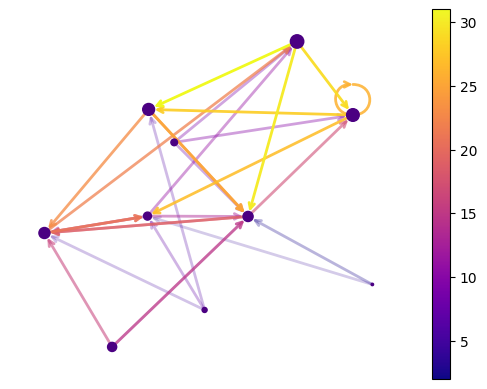

In [22]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import networkx as nx

seed = 13648  # Seed random number generators for reproducibility
G = nx.random_k_out_graph(10, 3, 0.5, seed=seed)
pos = nx.spring_layout(G, seed=seed)

node_sizes = [3 + 10 * i for i in range(len(G))]
M = G.number_of_edges()
edge_colors = range(2, M + 2)
edge_alphas = [(5 + i) / (M + 4) for i in range(M)]
cmap = plt.cm.plasma

nodes = nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color="indigo")
edges = nx.draw_networkx_edges(
    G,
    pos,
    node_size=node_sizes,
    arrowstyle="->",
    arrowsize=10,
    edge_color=edge_colors,
    edge_cmap=cmap,
    width=2,
)
# set alpha value for each edge
for i in range(M):
    edges[i].set_alpha(edge_alphas[i])

pc = mpl.collections.PatchCollection(edges, cmap=cmap)
pc.set_array(edge_colors)

ax = plt.gca()
ax.set_axis_off()
plt.colorbar(pc, ax=ax)
plt.show()

In [23]:
import json
node_file="../html_data/asqa/treegen/v0715/binghtml-slimplmqr-v0715-asqa-trainfew.jsonl"
dataset = "asqa"
search_engine = "bing"
split = "trainfew"
rewrite_method = "slimplmqr"
html_file=f"../html_data/{dataset}/{search_engine}/{search_engine}html-{rewrite_method}-{dataset}-simple-{split}.jsonl"
node_lines=[json.loads(line) for line in open(node_file)]
html_lines=[json.loads(line) for line in open(html_file)]

from transformers import AutoTokenizer, AutoModelForCausalLM, AutoModelForSeq2SeqLM

ckpt_path="../../../huggingface/glm-4-9b-chat-1m"
# ckpt_path="/cpfs01/shared/public/guopeidong/models/glm4-9b/glm4-9b-128k-v0701-node2/checkpoint-1554"
tokenizer = AutoTokenizer.from_pretrained(ckpt_path,trust_remote_code=True)

if "answers" in node_lines[0]:
    answers = [node_line['answers'] for node_line in node_lines]
elif "short_answers" in node_lines[0]:
    answers = [node_line['short_answers'] for node_line in node_lines]
elif "answer" in node_lines[0]:
    answers = [node_line['answer'] for node_line in node_lines]
else:
    raise NotImplementedError("answers not found in node_lines")

In [24]:
from typing import Tuple, List
import bs4
from collections import defaultdict

def split_tree(soup: bs4.BeautifulSoup) -> List[Tuple[bs4.element.Tag, List[str]]]:
    word_count = len(soup.get_text().split())
    if word_count > 500:
        possible_trees = [(soup, [])]
        target_trees = []
        #  split the entire dom tee into subtrees, until the length of the subtree is less than 500 words
        #  find all possible trees
        while True:
            if len(possible_trees) == 0:
                break
            tree = possible_trees.pop(0)
            tag_children = defaultdict(int)
            bare_word_count = 0
            #  count child tags
            for child in tree[0].contents:
                if isinstance(child, bs4.element.Tag):
                    tag_children[child.name] += 1
            _tag_children = {k: 0 for k in tag_children.keys()}
            for child in tree[0].contents:
                if isinstance(child, bs4.element.Tag):
                    #  change child tag with duplicate names
                    if tag_children[child.name] > 1:
                        new_name = f"{child.name}{_tag_children[child.name]}"
                        new_tree = (child, tree[1] + [new_name])
                        _tag_children[child.name] += 1
                        child.name = new_name
                    else:
                        new_tree = (child, tree[1] + [child.name])
                    word_count = len(child.get_text().split())
                    #  add node with more than 500 words, and recursion depth is less than 64
                    if word_count > 500 and len(new_tree[1]) < 64:
                        possible_trees.append(new_tree)
                    else:
                        target_trees.append(new_tree)
                else:
                    bare_word_count += len(str(child).split())

            #  add node with more than 500 words
            if bare_word_count > 500:
                target_trees.append(tree)
            #  add leaf node
            if len(tag_children) == 0:
                target_trees.append(tree)
    else:
        soup_children = [c for c in soup.contents if isinstance(c, bs4.element.Tag)]
        if len(soup_children) == 1:
            target_trees = [(soup_children[0], [soup_children[0].name])]
        else:
            # add an html tag to wrap all children
            new_soup = bs4.BeautifulSoup("", 'html.parser')
            new_tag = new_soup.new_tag("html")
            new_soup.append(new_tag)
            for child in soup_children:
                new_tag.append(child)
            target_trees = [(new_tag, ["html"])]
    return target_trees

In [25]:

idx=0
question = node_lines[idx]["question"]
html = node_lines[idx]["html"]
answer = answers[idx]
node_tree=node_lines[idx]["node_tree"]
paths=node_lines[idx]["paths"]
# best_trees, find_exact_match = get_best_tree(htmls, answer)
soup = bs4.BeautifulSoup(html, 'html.parser')

html_chunk_paths = split_tree(soup)
matched_paths = []

for path in html_chunk_paths:
    if calculate_short_answer_EM(str(path[0]), answer)["exact_match"] > 0.:
        matched_paths.append(path)
        
    

NameError: name 'calculate_short_answer_EM' is not defined

In [ ]:
import numpy as np
log_threshold=1e-10
print(f"number of paths: {len(paths)}")
print(f"number of matched paths: {len(matched_paths)}")
avg_token_depth=np.mean([len(p[1]) for p in html_chunk_paths])
min_token_depth=np.min([len(p[1]) for p in html_chunk_paths])
max_token_depth=np.max([len(p[1]) for p in html_chunk_paths])
print(f"the average,min,max token depth of all paths: {avg_token_depth}, {min_token_depth}, {max_token_depth}")
matched_avg_token_depth=np.mean([len(p[1]) for p in matched_paths])
matched_min_token_depth=np.min([len(p[1]) for p in matched_paths])
matched_max_token_depth=np.max([len(p[1]) for p in matched_paths])
print(f"the average,min,max token depth of matched paths: {matched_avg_token_depth}, {matched_min_token_depth}, {matched_max_token_depth}")
path_log_prob=[np.sum([np.log(p) if p>log_threshold else np.log(log_threshold) for p in path]) for path in path_probs]
avg_path_prob=np.mean(path_log_prob)
print(f"the average path probability of all paths: {avg_path_prob}")
# matched_path_log_prob=[np.sum([np.log(p) if p>log_threshold else np.log(log_threshold) for p in path]) for path in matched_path_probs]
# matched_avg_path_prob=np.mean(matched_path_log_prob)
# print(f"the average path probability of matched paths: {matched_avg_path_prob}")

In [26]:
from tqdm import tqdm
all_paths=[]
matched_paths = []
path_log_prob=[]
matched_path_log_prob=[]
for idx in tqdm(range(len(node_lines)), desc=f"Analyzing {node_file}"):
    question = node_lines[idx]["question"]
    html = node_lines[idx]["html"]
    answer = answers[idx]
    node_tree=node_lines[idx]["node_tree"]
    paths=node_lines[idx]["paths"]
    # best_trees, find_exact_match = get_best_tree(htmls, answer)
    # soup = bs4.BeautifulSoup(html, 'html.parser')
    
    # html_chunk_paths = split_tree(soup)
    # assert len(paths) == len(html_chunk_paths)
    
    all_paths.extend(paths)
    for path in paths:
        if calculate_short_answer_EM(str(path), answer)["exact_match"] > 0.:
            matched_paths.append(path)
    #  get the best tree probability
    root=TokenIdNode(-1, prob=1.0, input_ids=[])
    for nidx, line in enumerate(node_tree):
        node, prob, input_ids = line.split("|")
        node=int(node)
        prob=float(prob)
        input_ids = json.loads(input_ids)
        if node == -1:
            # root node
            pass
        else:
            # token=tokenizer.decode([node])
            parent=root
            for tid in input_ids:
                find_child=False
                for c in parent.children:
                    if c.input_ids[-1] == tid:
                        parent=c
                        find_child=True
                        break
                if not find_child:
                    break
            node=TokenIdNode(node, parent=parent, prob=prob, input_ids=input_ids)
    
    
    #  get the matched tree path log probability
    for pidx in range(len(matched_paths)):
        matched_path=matched_paths[pidx]
        str_path="<" + "><".join(matched_path) + ">"
        path_tokens = tokenizer.encode(str_path, add_special_tokens=False)
        path_token_prob=[]
        node=root
        for tid in path_tokens:
            for c in node.children:
                if c.name == tid:
                    node=c
                    # print(f"token id: {tid}, token: {tokenizer.decode([tid])}, prob: {node.prob}")
                    path_token_prob.append(node.prob)
                    break
        matched_path_log_prob.append(np.sum([np.log(p) if p>log_threshold else np.log(log_threshold) for p in path_token_prob]))
        
    #  get the all tree path log probability
    for pidx in range(len(paths)):
        path=paths[pidx]
        str_path="<" + "><".join(path) + ">"
        path_tokens = tokenizer.encode(str_path, add_special_tokens=False)
        path_token_prob=[]
        node=root
        for tid in path_tokens:
            for c in node.children:
                if c.name == tid:
                    node=c
                    # print(f"token id: {tid}, token: {tokenizer.decode([tid])}, prob: {node.prob}")
                    path_token_prob.append(node.prob)
                    break
        path_log_prob.append(np.sum([np.log(p) if p>log_threshold else np.log(log_threshold) for p in path_token_prob]))
        

Analyzing ../html_data/asqa/treegen/v0715/binghtml-slimplmqr-v0715-asqa-trainfew.jsonl:   0%|          | 0/1000 [00:00<?, ?it/s]


NameError: name 'calculate_short_answer_EM' is not defined

In [ ]:
#  plot the path probability distribution
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots()
plt.subplots_adjust(hspace=0)

#  x axis is the depth of paths, max depth is 16
x_ticks=np.linspace(0, 16, 9)
#  y axis is the path probability
y_ticks=np.linspace(-50, 0, 6)
#  plot all paths
token_depth_prob={n: [] for n in range(1, 17)}
#  plot all paths
for pid in range(len(all_paths)):
    path=all_paths[pid]
    depth=min(len(path), 16)
    token_depth_prob[depth].append(path_log_prob[pid])
x_labels=[n for n in range(1, 17)]
y_labels=[np.mean(token_depth_prob[n]) for n in range(1, 17)]
ax.plot(x_labels, y_labels, label="all paths", color="blue", marker="o", linestyle="-")
#  plot matched paths
matched_token_depth_prob={n: [] for n in range(1, 17)}
for pid in range(len(matched_paths)):
    path=matched_paths[pid]
    depth=min(len(path), 12)
    matched_token_depth_prob[depth].append(matched_path_log_prob[pid])
matched_x_labels=[n for n in range(1, 13)]
matched_y_labels=[np.mean(matched_token_depth_prob[n]) for n in range(1, 13)]
ax.plot(matched_x_labels, matched_y_labels, label="matched paths", color="red", marker="^", linestyle="-")

ax.set_xticks(x_ticks)
ax.set_yticks(y_ticks)
ax.set_ylim(-50, 0)
ax.set_xlabel("Depth of paths")
ax.set_ylabel("Path log probability")
ax.legend()
plt.show()


In [18]:
print(matched_y_labels)

NameError: name 'matched_y_labels' is not defined

In [209]:

#  analyze the best tree distribution
# for idx in tqdm(range(10), desc=f"Analyzing {node_file}"):
idx=0
question = node_lines[idx]["question"]
htmls = [node_lines[idx]["html"]]
_htmls=[h["html"] for h in html_lines[idx][f'{rewrite_method}_results']]
answer = answers[idx]
node_tree=node_lines[idx]["node_tree"]
best_trees, find_exact_match = get_best_tree(htmls, answer)
_best_trees, _find_exact_match = get_best_tree(_htmls, answer)
if _find_exact_match:
    _unmatched_trees = [t for t in _best_trees if t['best_score'] == 0]
    _sorted_trees = sorted(_best_trees, key=lambda x: x['best_score'], reverse=True)
    _best_html_tree = _sorted_trees[0]
else:
    no_exact_match += 1
_input_ref_idxs = [_best_html_tree['h_index']] + [t['h_index'] for t in unmatched_trees]

_input_refs = [_htmls[i] for i in _input_ref_idxs]
_input_html = get_html_ref(_input_refs, _best_html_tree, tokenizer)

if find_exact_match:
    unmatched_trees = [t for t in best_trees if t['best_score'] == 0]
    sorted_trees = sorted(best_trees, key=lambda x: x['best_score'], reverse=True)
    best_html_tree = sorted_trees[0]
else:
    no_exact_match += 1
    # continue
#  take the best tree and sample several unmatched trees
input_ref_idxs = [best_html_tree['h_index']] + [t['h_index'] for t in unmatched_trees]

assert find_exact_match == _find_exact_match and len(best_trees) == len(_best_trees), f"find_exact_match: {find_exact_match}, _find_exact_match: {_find_exact_match}, best_trees: {len(best_trees)}, _best_tree: {len(_best_trees)}"


AssertionError: find_exact_match: True, _find_exact_match: True, best_trees: 1, _best_tree: 36

In [211]:
# print(_input_html)

print([t["best_tree"][1] for t in best_trees])
#  ['html15', 'body', 'form', 'article']
print([t["best_tree"][1] for t in _best_trees if t["best_tree"] is not None])
#  '29|1.0|[15515, 1784, 611, 15, 1784, 3817, 1784, 36207, 1228, 29]'

[['html15', 'body', 'form', 'article']]
[['html', 'div', 'main', 'div', 'div0'], ['html'], ['html', 'div', 'div0', 'article', 'header'], ['html', 'body', 'main', 'article', 'div4', 'table0'], ['body', 'div0', 'main', 'div0', 'div1', 'div0', 'div0'], ['html', 'body', 'div', 'div1', 'div1', 'div', 'table', 'tbody', 'tr3'], ['html', 'body', 'ul'], ['html', 'body', 'form', 'article', 'div', 'div0'], ['html'], ['html', 'body', 'div', 'div1', 'div1', 'article', 'div1', 'div0', 'table', 'tbody', 'tr2'], ['html', 'body', 'div', 'div1', 'div0', 'div0'], ['html', 'div', 'div1', 'div0'], ['html', 'body', 'form', 'article'], ['html'], ['html', 'title'], ['html'], ['html', 'div', 'div1', 'div0', 'main', 'div', 'ul0'], ['html', 'body', 'div', 'div1'], ['html', 'body', 'table', 'td', 'table', 'tbody', 'tr1'], ['html', 'body', 'div', 'div1', 'div1', 'article', 'div1', 'html', 'p19'], ['html', 'body', 'div1', 'div1', 'div', 'div', 'section', 'figcaption'], ['html', 'div', 'article'], ['html', 'body', '

In [29]:

#  construct anytree
root=TokenIdNode(-1, prob=1.0, input_ids=[])
for nidx, line in enumerate(gragh_nodes):
    token_id, prob, input_ids = line.split("|")
    token_id=int(token_id)
    prob=float(prob)
    input_ids = json.loads(input_ids)
    if token_id == -1:
        # root node
        pass
    else:
        token=tokenizer.decode([token_id])
        parent=root
        for tid in input_ids:
            find_child=False
            for c in parent.children:
                if c.input_ids[-1] == tid:
                    parent=c
                    find_child=True
                    break
            if not find_child:
                break
        node=TokenIdNode(token_id, parent=parent, prob=prob, input_ids=input_ids)

#  get best tree path log probability
path="<" + "><".join(best_trees[0]["best_tree"][1]) + ">"
path_tokens = tokenizer.encode(path, add_special_tokens=False)
path_token_probs=[]
#  get path token probs
node=root
for tid in path_tokens:
    for c in node.children:
        if c.name == tid:
            node=c
            print(f"token id: {tid}, token: {tokenizer.decode([tid])}, prob: {node.prob}")
            path_token_probs.append(node.prob)
            break

NameError: name 'best_trees' is not defined

In [63]:
import json
import numpy as np
import bs4
import matplotlib.pyplot as plt
import matplotlib as mpl
import networkx as nx

node_file="../html_data/asqa/treegen/v0715/binghtml-slimplmqr-v0715-asqa-trainfew.jsonl"
node_lines=[json.loads(line) for line in open(node_file)]
idx=0
node_tree=node_lines[idx]["node_tree"]
DG = nx.DiGraph()
depths = []
for nidx, line in enumerate(gragh_nodes):
    node, prob, input_ids = line.split("|")
    unique_id = f"{nidx}"
    node=int(node)
    prob=float(prob)
    input_ids = json.loads(input_ids)
    depths.append(len(input_ids))
    if node == -1:
        # root node
        DG.add_node(nidx, token_id=node, token="root", input_ids=input_ids, log_prob=0.0, depth=0)
    else:
        token=tokenizer.decode([node])
        
        #  get parent node
        parent=0
        while True:
            has_child=False
            for c in DG.successors(parent):
                parent_token_length = len(DG.nodes[parent]["input_ids"])
                child_token_length = len(DG.nodes[c]["input_ids"])
                offset=DG.nodes[c]["input_ids"][parent_token_length:]
                _offset=input_ids[parent_token_length:child_token_length]
                # print(f"parent: {parent}, child: {c}, offset: {offset}, _offset: {_offset}")
                #  if every token in the child node is a sub token of the parent node
                if offset == _offset:
                    parent=c
                    has_child=True
                    break
            if not has_child:
                break
        if prob >= 1.0 and len(list(DG.predecessors(parent))) == 1:
            #  replace the parent node with the current node
            DG.nodes[parent]["token"] += token
            # print(f"append token {nidx}:{token} to parent {parent}:{DG.nodes[parent]['token']}")
        else:
            parent_log_prob = DG.nodes[parent]["log_prob"]
            parent_depth = DG.nodes[parent]["depth"]
            DG.add_node(nidx, token_id=node, token=token, input_ids=input_ids, log_prob=parent_log_prob + np.log10((max(prob, 1e-12))), depth=parent_depth + 1)
            DG.add_edge(parent, nidx, weight=prob)
            

number of nodes: 2278


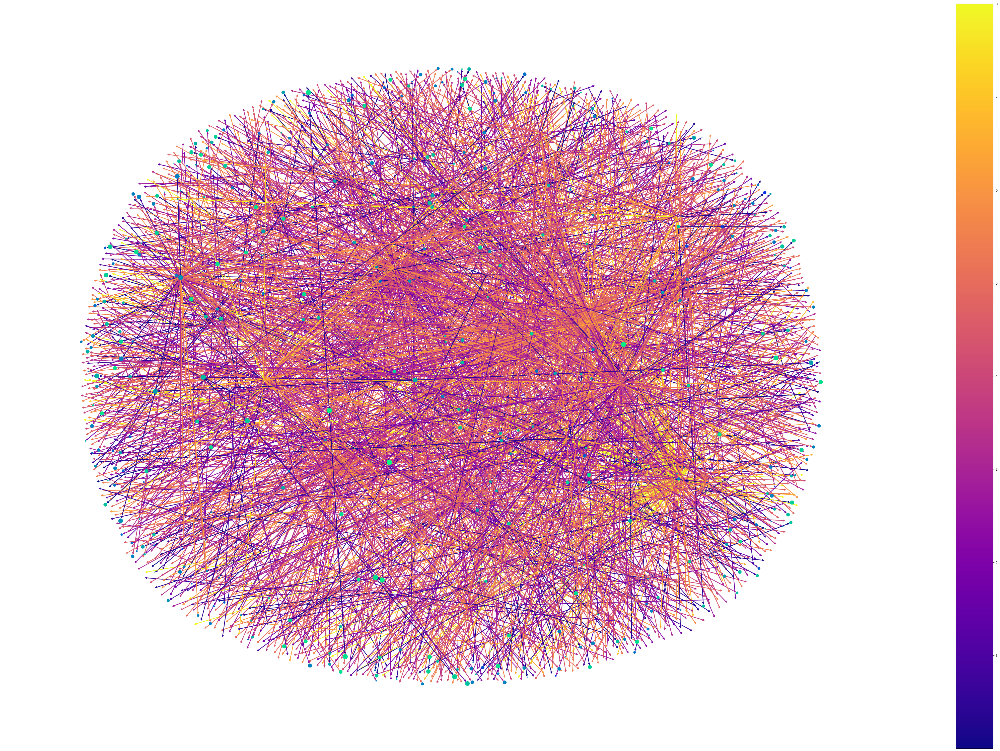

In [72]:
gragh_nodes=node_tree
from numpy import clip

# visit all nodes, remove nodes which is the only child of its parent
for nidx in list(DG.nodes):
    #  assert weighted out degree is less than 1
    assert DG.out_degree(nidx, weight="weight") <= 1.1, f"node {nidx} out degree: {DG.out_degree(nidx, weight='weight')}"
    # if len(list(DG.predecessors(nidx))) == 1:
    #     parent = list(DG.predecessors(nidx))[0]
    #     if len(list(DG.successors(parent))) == 1:
    #         DG.remove_node(nidx)

        
# draw graph
seed = 13648
pos = nx.spring_layout(DG, seed=seed)
node_depths = [-min(DG.nodes[n]["depth"], 16) for n in DG.nodes()]
node_colors = node_depths
print(f"number of nodes: {len(DG)}")
node_sizes = [max(200 + 20 * DG.nodes[n]["log_prob"], 0) for n in DG.nodes()]
edge_weights = [-np.log10(max(DG[u][v]['weight'], 1e-8)) for u,v in DG.edges()]
edge_colors = edge_weights
edge_alphas = [(clip(e, -8, 0) + 8 ) / 8 for e in edge_weights]

edge_cmap = plt.cm.plasma
node_cmap = mpl.cm.winter

nodes = nx.draw_networkx_nodes(DG, pos, node_size=node_sizes, node_color=node_colors, cmap=node_cmap)
edges = nx.draw_networkx_edges(
    DG,
    pos,
    node_size=node_sizes,
    arrowstyle="->",
    arrowsize=10,
    edge_color=edge_colors,
    edge_cmap=edge_cmap,
    width=2,
)
# set alpha value for each edge
for i in range(len(DG.edges())):
    edges[i].set_alpha(edge_alphas[i])

pc = mpl.collections.PatchCollection(edges, cmap=cmap)
pc.set_array(edge_colors)

#  show the color map
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))

fig = plt.gcf()
fig.set_size_inches(45, 30)
ax = plt.gca()
# ax.imshow(gradient, aspect='auto', cmap=node_cmap)
ax.set_axis_off()
plt.tight_layout()
plt.colorbar(pc, ax=ax)
plt.savefig("../figures/tree-graph.png")

        

In [65]:
print(node_colors)

[0, -1, -2, -2, -2, -2, -2, -3, -3, -4, -4, -4, -5, -5, -6, -6, -7, -7, -8, -8, -9, -9, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -10, -6, -2, -3, -3, -4, -4, -5, -5, -6, -6, -6, -7, -7, -7, -8, -9, -9, -9, -9, -9, -8, -9, -9, -9, -9, -9, -9, -9, -9, -9, -9, -9, -8, -8, -9, -9, -9, -9, -9, -9, -9, -9, -9, -9, -2, -3, -4, -4, -4, -4, -5, -5, -5, -5, -5, -6, -7, -7, -7, -7, -6, -7, -7, -7, -7, -7, -7, -7, -7, -7, -7, -7, -7, -7, -7, -7, -7, -7, -6, -7, -7, -7, -7, -7, -7, -7, -7, -7, -7, -7, -7, -7, -7, -7, -2, -3, -3, -4, -4, -5, -6, -6, -7, -7, -8, -8, -9, -9, -9, -10, -10, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -11, -

In [123]:
for node in DG.nodes():
    print(node, "token_id:", DG.nodes[node]["token_id"], "token:", DG.nodes[node]["token"])

0 token_id: -1 token: root
1 token_id: 13736 token: <html
2 token_id: 22 token: 7>
4 token_id: 24 token: 9>
6 token_id: 15 token: 0><
8 token_id: 2102 token: title
9 token_id: 29 token: >
10 token_id: 2599 token: body
11 token_id: 1784 token: ><
12 token_id: 2708 token: header>
14 token_id: 611 token: div
15 token_id: 15 token: 0
16 token_id: 29 token: >
17 token_id: 16 token: 1
18 token_id: 1784 token: ><
19 token_id: 611 token: div


In [127]:

for edge in DG.edges():
    print(edge, "weight:", DG[edge[0]][edge[1]]['weight'])

(0, 1) weight: 1.0
(1, 2) weight: 0.0209198
(1, 4) weight: 0.004814148
(1, 6) weight: 0.018173218
(6, 8) weight: 0.5546875
(6, 10) weight: 0.44555664
(10, 12) weight: 0.07696533
(10, 14) weight: 0.92285156
(14, 15) weight: 0.013847351
(14, 17) weight: 0.9863281


In [112]:
tokenizer.encode(">")

[151331, 151333, 29]

In [10]:

#  analyze the way to parse the html node probability
from bs4 import Comment
from anytree import Node
import numpy as np
import re
import json
import bs4
from transformers import AutoTokenizer

node_tokenizer = AutoTokenizer.from_pretrained("../../../huggingface/glm-4-9b-chat-1m", trust_remote_code=True)
chat_tokenizer_path = "../../../huggingface/Baichuan2-7B-Chat/"
chat_tokenizer = AutoTokenizer.from_pretrained(chat_tokenizer_path, trust_remote_code=True)

context_window = "16k"
max_context_window = re.match(r"(\d+)k", context_window).group(1)
#  reserved 2k tokens for prompt
max_context_window = (int(max_context_window) - 2) * 1000
log_threshold = 1e-9

def truncate_input(html, max_context_window=30000):
    if isinstance(html, list):
        html = " ".join(html)
    #  if html is longer than 30000 tokens, truncate it
    tokens = chat_tokenizer.tokenize(html)
    if len(tokens) > max_context_window:
        html = chat_tokenizer.convert_tokens_to_string(tokens[:max_context_window])
        # print(f"html truncated to {max_context_window} tokens")
    return html

def simplify_html(soup):
    for script in soup(["script", "style"]):
        script.decompose()
    #  remove all attributes
    for tag in soup.find_all(True):
        tag.attrs = {}
    #  remove empty tags recursively
    while True:
        removed = False
        for tag in soup.find_all():
            if not tag.text.strip():
                tag.decompose()
                removed = True
        if not removed:
            break
    #  remove href attributes
    for tag in soup.find_all("a"):
        del tag["href"]
    #  remove comments
    comments = soup.find_all(string=lambda text: isinstance(text, Comment))
    for comment in comments:
        comment.extract()

    def concat_text(text):
        text = "".join(text.split("\n"))
        text = "".join(text.split("\t"))
        text = "".join(text.split(" "))
        return text

    # remove all tags with no text
    for tag in soup.find_all():
        children = [child for child in tag.contents if not isinstance(child, str)]
        if len(children) == 1:
            tag_text = tag.get_text()
            child_text = "".join([child.get_text() for child in tag.contents if not isinstance(child, str)])
            if concat_text(child_text) == concat_text(tag_text):
                tag.replace_with_children()
    #  if html is not wrapped in a html tag, wrap it

    # remove empty lines
    res = str(soup)
    lines = [line for line in res.split("\n") if line.strip()]
    res = "\n".join(lines)
    return res

class TokenIdNode(Node):
    def __init__(self, name, parent=None, children=None, **kwargs):
        super().__init__(name, parent, children, **kwargs)
        self.input_ids = kwargs.get('input_ids', [])
        self.prob = kwargs.get('prob', np.float32(0.0))
        

ckpt_version="v0715"
split = "test"
rewrite_method = "slimplmqr"
dataset = "asqa"
search_engine="bing"


input_file = f"../html_data/{dataset}/treegen/{ckpt_version}/{search_engine}html-{rewrite_method}-{ckpt_version}-{dataset}-{split}.jsonl"
print(f"input_file: {input_file}")
data_lines = [json.loads(line) for line in open(input_file)]

idx=1
html = data_lines[idx]["html"]
paths = data_lines[idx]["paths"]
path_divisible = data_lines[idx]["path_divisible"]
node_tree = data_lines[idx]["node_tree"]
#  reconstruct the token node tree
root = TokenIdNode(-1, prob=1.0, input_ids=[])
for nidx, line in enumerate(node_tree):
    node, prob, input_ids = line.split("|")
    node = int(node)
    prob = float(prob)
    input_ids = json.loads(input_ids)
    if node == -1:
        # root node
        pass
    else:
        # token = node_tokenizer.decode([node])
        parent = root
        for tid in input_ids:
            find_child = False
            for c in parent.children:
                if c.input_ids[-1] == tid:
                    parent = c
                    find_child = True
                    break
            if not find_child:
                break
        node = TokenIdNode(node, parent=parent, prob=prob, input_ids=input_ids)

#  sort paths by prob
path_probs = []
node_probs = []
for pidx in range(len(paths)):
    path = paths[pidx]
    str_path = "<" + "><".join(path) + ">"
    path_tokens = node_tokenizer.encode(str_path, add_special_tokens=False)
    path_token_prob = []
    node = root
    for tid in path_tokens:
        for c in node.children:
            if c.name == tid:
                node = c
                # print(f"token id: {tid}, token: {node_tokenizer.decode([tid])}, prob: {node.prob}")
                path_token_prob.append(node.prob)
                break
    assert len(path_token_prob) == len(path_tokens), f""
    path_probs.append(path_token_prob)

average_depth = np.mean([len(p) for p in paths])
#  node prob is the last token prob that is not 1.0
node_probs = [np.log(path_probs[i][-1]) if path_probs[i][-1] > log_threshold else np.log(log_threshold) for i in range(len(path_probs))]
path_log_probs = [np.sum([np.log(p) if p > log_threshold else np.log(log_threshold) for p in path]) / average_depth
                  for path in path_probs]

paths = [{"path": paths[i], "path_prob": path_log_probs[i], "node_prob":node_probs[i], "divisible": path_divisible[i]} for i in range(len(paths))]
#  sort paths by prob

soup = bs4.BeautifulSoup(html, 'html.parser')
for idj in range(len(paths)):
    path = paths[idj]["path"]
    tag = soup
    for p in path:
        for child in tag.contents:
            if isinstance(child, bs4.element.Tag):
                if child.name == p:
                    tag = child
                    break

    paths[idj]["tag"] = tag
    paths[idj]["token_length"] = len(chat_tokenizer.encode(str(tag), add_special_tokens=False))
    paths[idj]["prob"] = paths[idj]["path_prob"] + paths[idj]["node_prob"]
    if paths[idj]["token_length"] < 64:
        #  move paths that are too short to the end
        paths[idj]["prob"] -= 1000
    
paths = sorted(paths, key=lambda x: x["prob"], reverse=True)  

total_token_length = sum([p["token_length"] for p in paths])

def trim_path(path):
    #  not divisible, remove the tag
    if not path["divisible"]:
        path["tag"].decompose()
        return
    #  divisible, remove the text directly under the tag
    else:
        for c in path["tag"].contents:
            if not isinstance(c, bs4.element.Tag):
                # print(c)
                #  remove the text node
                c.extract()

input_file: ../html_data/asqa/treegen/v0715/binghtml-slimplmqr-v0715-asqa-test.jsonl


In [11]:
print(data_lines[idx]["question"], data_lines[idx]["short_answers"])
print([len(p["path"]) for p in paths[:100]])
print([len(p["path"]) for p in paths[-100:]])
print([p["token_length"] for p in paths[:100]])
print([p["token_length"] for p in paths[-100:]])

Who played the weasley brothers in harry potter? ['Richard Fish', 'Chris Rankin', 'James Phelps', 'Rupert Grint', 'Oliver Phelps', 'Domhnall Gleeson']
[3, 3, 7, 7, 3, 3, 3, 7, 3, 3, 3, 4, 7, 3, 3, 7, 3, 4, 7, 3, 3, 4, 3, 3, 7, 7, 3, 9, 6, 3, 3, 3, 3, 4, 3, 6, 4, 3, 5, 8, 3, 3, 3, 7, 7, 5, 3, 3, 7, 4, 7, 9, 4, 3, 7, 7, 3, 7, 8, 5, 3, 5, 9, 3, 7, 9, 3, 7, 7, 7, 3, 3, 3, 3, 3, 3, 7, 3, 4, 3, 3, 6, 9, 3, 5, 6, 5, 3, 4, 5, 7, 9, 7, 5, 4, 4, 5, 7, 6, 3]
[8, 7, 8, 8, 8, 8, 8, 8, 7, 7, 7, 8, 8, 7, 7, 8, 8, 7, 7, 8, 8, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 7, 7, 7, 7, 7, 7, 8, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 7, 7, 7, 8, 7, 8, 7, 7, 8, 7, 7, 8, 7, 8, 7, 7, 7, 7, 8, 7, 7, 8, 7, 7, 7, 7, 7, 7, 7, 7, 7]
[101, 2021, 127, 359, 309, 112, 83, 87, 115, 2021, 1105, 1027, 89, 231, 2021, 64, 797, 432, 108, 2111, 560, 167, 2021, 255, 75, 116, 198, 144, 75, 2021, 797, 255, 2021, 658, 797, 90, 1027, 203, 94, 200, 327, 309, 2021, 129, 93, 717, 1027, 560, 67,

In [12]:
# print(" ".join(p["tag"].get_text() for p in paths[:10]))
for answer in data_lines[idx]["short_answers"]:
    for p in paths[:10]:
        if answer in p["tag"].get_text():
            print(answer, p["tag"].get_text())

Rupert Grint 
Harry Potter Wiki


Explore

Main Page
Discuss
All Pages
Community
Interactive Maps
Recent Blog Posts



Books


The Seven Novels

Harry Potter and the Philosopher's Stone
Harry Potter and the Chamber of Secrets
Harry Potter and the Prisoner of Azkaban
Harry Potter and the Goblet of Fire
Harry Potter and the Order of the Phoenix
Harry Potter and the Half-Blood Prince
Harry Potter and the Deathly Hallows



Rowling's Companion Writings

Fantastic Beasts and Where to Find Them
Quidditch Through the Ages
The Tales of Beedle the Bard
Harry Potter Prequel
Pottermore



Other Written Works

Harry Potter: A Pop-Up Book
Harry Potter Film Wizardry
Harry Potter Page to Screen: The Complete Filmmaking Journey
LEGO Harry Potter: Building the Magical World
LEGO Harry Potter: Characters of the Magical World



Characters

Harry Potter
Hermione Granger
Ronald Weasley
Ginny Weasley
Albus Dumbledore
Lord Voldemort
Neville Longbottom
Draco Malfoy
Severus Snape
Rubeus Hagrid





Films


Th

In [ ]:
#  remove low prob paths
while total_token_length > max_context_window:
    if len(paths) == 1:
        break
    discarded_path = paths.pop()
    total_token_length -= discarded_path["token_length"]
    trim_path(discarded_path)

total_token_length = len(chat_tokenizer.encode(simplify_html(soup), add_special_tokens=False))
while total_token_length > max_context_window:
    if len(paths) == 1:
        break
    discarded_path = paths.pop()
    trim_path(discarded_path)
    total_token_length = len(chat_tokenizer.encode(simplify_html(soup), add_special_tokens=False))

if total_token_length > max_context_window:
    # loguru.logger.warning(f"dataset {dataset} sample {idx} cannot be trimmed to {max_context_window} tokens")
    html_trim = truncate_input(simplify_html(soup), max_context_window)
else:
    html_trim = simplify_html(soup)

In [2]:
len(html_trim)

42409

In [6]:
from langchain_community.embeddings import HuggingFaceHubEmbeddings
from typing import List
import json

class TEIEmbeddings(HuggingFaceHubEmbeddings):
    def embed_documents(self, texts: List[str]) -> List[List[float]]:
        # replace newlines, which can negatively affect performance.
        texts = [text.replace("\n", " ") for text in texts]
        _model_kwargs = self.model_kwargs or {}
        responses = self.client.post(
            json={"inputs": texts, "parameters": _model_kwargs, "truncate": True}, task=self.task
        )
        return json.loads(responses.decode())

embeddings = TEIEmbeddings(model="http://172.16.0.96/", huggingfacehub_api_token="aa", model_kwargs={"truncate": True, "huggingfacehub_api_token": ""})
query_result = embeddings.embed_query("This is a text. "*1000)
print(query_result)

/data_train/search/InternData/jiejuntan/anaconda3/envs/py39/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


[-0.0027591938, -0.013353699, 0.011949848, 0.027917221, -0.01916313, -0.010511758, -0.011476192, 0.003001729, 0.053643066, 0.021582773, 0.0080179265, 0.002538059, -0.0033498383, -0.019322917, -0.037915375, 0.0075613894, -0.017371222, -0.03182061, -0.033281527, 0.00587791, -0.03615771, 0.015636383, -0.073502414, -0.048621163, -0.003823495, 0.034514178, 0.020441432, 0.03298478, 0.020441432, 0.07423287, -0.031249939, -0.024493195, 0.017348396, -0.048895083, -0.030839056, -0.0010892681, 0.04054046, -0.02197083, -0.012166704, -0.034080468, 0.03736753, -0.0336011, 0.045471057, -0.02197083, -0.052501723, -0.01749677, -0.0069964253, -0.018957688, -0.0023311907, -0.04090569, 0.024264928, -0.023991005, 0.044329718, -0.00022113498, 0.0026536197, 0.012828682, 0.003700801, -0.029606408, -0.027392203, 0.03579248, 0.009045134, 0.008725558, 0.028031355, -0.06610652, -0.005058998, -0.005555481, -0.004120244, -0.019140303, 0.024036659, -0.05989762, -0.00761275, 0.00841169, -0.0022998038, -0.037436012, -